In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
os.chdir(r'/content/drive/MyDrive/Colab Notebooks/ece1512/ProjectA')  # Change the directory to torchRay-master folder

# Requirements

In [3]:
import os
import numpy as np
import pandas as pd
import requests
import scipy
import pickle
from scipy.ndimage.filters import gaussian_filter
from scipy.interpolate import interp1d
import tensorflow
import keras
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Dense, Flatten
from keras import regularizers
import keras.backend as K
from keras.models import load_model
from tensorflow.core.util import event_pb2
from tensorflow.python.lib.io import tf_record
import sklearn.metrics as metrics
import matplotlib.pyplot as plt
import cv2

In [4]:
from mnist1d_utils import *

# Dataset

In [5]:
dataset = make_dataset()

**Dataset:** A dictionary conaining 4000 train and 1000 test data.

Keys of the dictionary:

* 'x' : Training data.

* 'y' : Training labels.

* 'x_test' : Test data.

* 'y_test : Test labels.

* 't' : Mapping data points to spatial locations.

* 'templates' : The templates for the digits 0-9.

Text(0.5, 1.0, 'predicted class: 6')

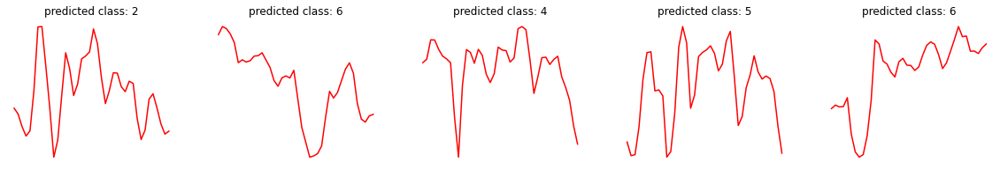

In [6]:
#@title Show some examples from the MNIST 1-D dataset

plt.figure(figsize=(20,3))

plt.subplot(151)
plt.plot(dataset['x'][0], 'r')
plt.axis('off')
plt.title('predicted class: '+str(dataset['y'][0]))

plt.subplot(152)
plt.plot(dataset['x'][1], 'r')
plt.axis('off')
plt.title('predicted class: '+str(dataset['y'][1]))

plt.subplot(153)
plt.plot(dataset['x'][2], 'r')
plt.axis('off')
plt.title('predicted class: '+str(dataset['y'][2]))

plt.subplot(154)
plt.plot(dataset['x'][3], 'r')
plt.axis('off')
plt.title('predicted class: '+str(dataset['y'][3]))

plt.subplot(155)
plt.plot(dataset['x'][4], 'r')
plt.axis('off')
plt.title('predicted class: '+str(dataset['y'][4]))

Text(0.5, 1.0, 'predicted class: 9')

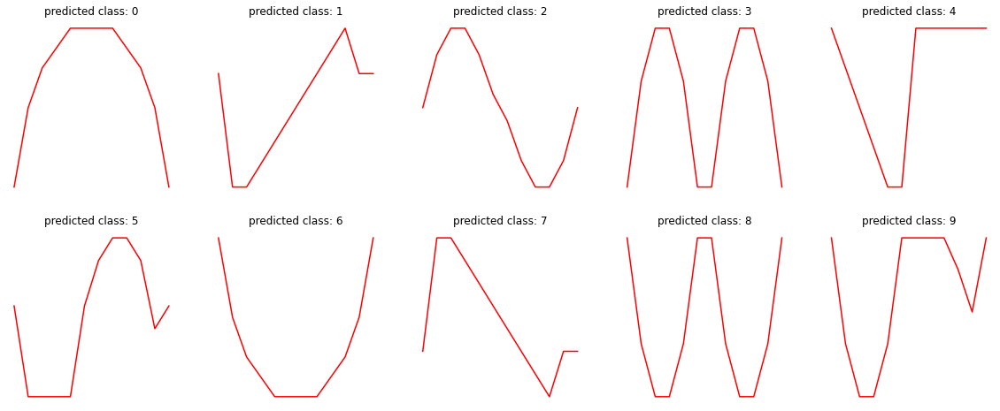

In [7]:
#@title Show the digit templates in the MNIST 1-D dataset 

plt.figure(figsize=(20,8))

plt.subplot(251)
plt.plot(dataset['templates']['x'][0], 'r')
plt.axis('off')
plt.title('predicted class: 0')

plt.subplot(252)
plt.plot(dataset['templates']['x'][1], 'r')
plt.axis('off')
plt.title('predicted class: 1')

plt.subplot(253)
plt.plot(dataset['templates']['x'][2], 'r')
plt.axis('off')
plt.title('predicted class: 2')

plt.subplot(254)
plt.plot(dataset['templates']['x'][3], 'r')
plt.axis('off')
plt.title('predicted class: 3')

plt.subplot(255)
plt.plot(dataset['templates']['x'][4], 'r')
plt.axis('off')
plt.title('predicted class: 4')

plt.subplot(256)
plt.plot(dataset['templates']['x'][5], 'r')
plt.axis('off')
plt.title('predicted class: 5')

plt.subplot(257)
plt.plot(dataset['templates']['x'][6], 'r')
plt.axis('off')
plt.title('predicted class: 6')

plt.subplot(258)
plt.plot(dataset['templates']['x'][7], 'r')
plt.axis('off')
plt.title('predicted class: 7')

plt.subplot(259)
plt.plot(dataset['templates']['x'][8], 'r')
plt.axis('off')
plt.title('predicted class: 8')

plt.subplot(2,5,10)
plt.plot(dataset['templates']['x'][9], 'r')
plt.axis('off')
plt.title('predicted class: 9')

Saving the dataset

In [8]:
f = open("MNIST1D.pkl","wb")
pickle.dump(dataset,f)
f.close()

# Model Creation

**Creating model :**

A 1-Dimensional CNN, containing 3 convolutional layers, followed by a fully-connected output layer.

In [9]:
##Task1-Question1
weight_decay = 5e-4
model = Sequential()
#Your code starts from here 
print(dataset['x'].shape, dataset['y'].shape, dataset['x_test'].shape, dataset['y_test'].shape)
dataset['x'] = np.expand_dims(dataset['x'], 2)
# dataset['x_test'] = np.expand_dims(dataset['x_test'], 2)

one_hot_y = np.zeros((dataset['y'].size, 10))
one_hot_y[np.arange(dataset['y'].size),dataset['y']] = 1
dataset['y'] = one_hot_y

# one_hot_y_test = np.zeros((dataset['y_test'].size, 10))
# one_hot_y_test[np.arange(dataset['y_test'].size),dataset['y_test']] = 1
# dataset['y_test'] = one_hot_y_test


model.add(Conv1D(25, 5, 1, 'same', activation='relu', kernel_regularizer=regularizers.l2(weight_decay), bias_regularizer=regularizers.l2(weight_decay)))
model.add(Conv1D(25, 3, 1, 'same', activation='relu', kernel_regularizer=regularizers.l2(weight_decay), bias_regularizer=regularizers.l2(weight_decay)))
model.add(Conv1D(25, 3, 1, 'same', activation='relu', kernel_regularizer=regularizers.l2(weight_decay), bias_regularizer=regularizers.l2(weight_decay)))
model.add(Flatten())
model.add(Dense(10, activation='softmax', kernel_regularizer=regularizers.l2(weight_decay), bias_regularizer=regularizers.l2(weight_decay)))
##

(4000, 40) (4000,) (1000, 40) (1000,)


# Training the model

Compiling the model

Loss function: Cross-entropy

Optimizer: Stochastic Gradient Descent (SGD) (learning rate = 0.01)

Tensorboard: For recording the training procedure

In [10]:
import datetime
%load_ext tensorboard
%tensorboard --logdir logs
##Task1-Question2
loss_fn = keras.losses.CategoricalCrossentropy()
#Your code
model.compile(optimizer='sgd',
              loss=loss_fn,
              metrics=['accuracy'])

logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = keras.callbacks.TensorBoard(logdir, histogram_freq=1)

model.fit(dataset['x'], dataset['y'], epochs=200, callbacks=tensorboard_callback)


##

Output hidden; open in https://colab.research.google.com to view.

# Plotting the training progress

Overall Accuracy is 0.917
Accuracy for class 0 is 1.0
Accuracy for class 1 is 0.9230769230769231
Accuracy for class 2 is 0.8651685393258427
Accuracy for class 3 is 0.9905660377358491
Accuracy for class 4 is 0.8962264150943396
Accuracy for class 5 is 0.8469387755102041
Accuracy for class 6 is 0.9696969696969697
Accuracy for class 7 is 0.8854166666666666
Accuracy for class 8 is 0.9693877551020408
Accuracy for class 9 is 0.8137254901960784
(1000,) (1000,)
(1000,) (1000,)
(1000,) (1000,)
(1000,) (1000,)
(1000,) (1000,)
(1000,) (1000,)
(1000,) (1000,)
(1000,) (1000,)
(1000,) (1000,)
(1000,) (1000,)
Precision: 0.917, Recall: 0.917, F1: 0.917


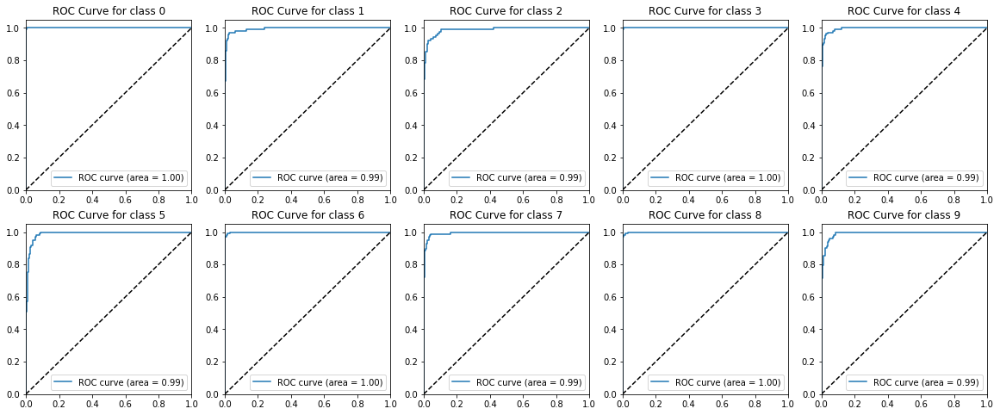

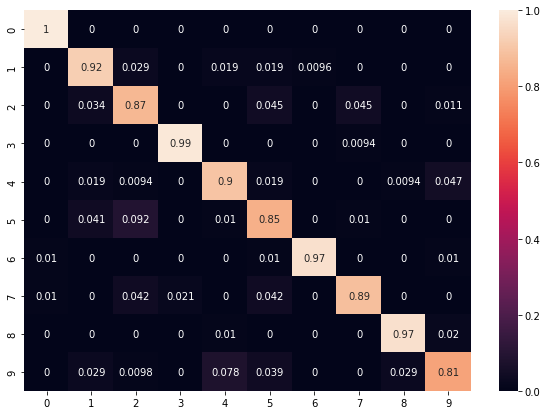

In [15]:
from matplotlib import test
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd
from sklearn.metrics import precision_recall_fscore_support
##Task1-Question3.a

#Your code
## show training accuracy and loss
# from tensorboard import notebook
# notebook.list()
# notebook.display(port=6006, height=1000) 

## overall classification accuracy on test set
prob = model(dataset['x_test'])
prediction = np.argmax(prob, axis=1)

onehot_test_label = dataset['y_test']
one_hot_y_test = np.zeros((onehot_test_label.size, 10))
one_hot_y_test[np.arange(onehot_test_label.size),onehot_test_label] = 1
onehot_test_label = one_hot_y_test

test_label = np.argmax(onehot_test_label, axis=1)
test_accuracy = np.sum(prediction == test_label) / prediction.shape[0]
print("Overall Accuracy is", test_accuracy)

## Class-wise classification accuracy for all classes
for i in range(10):
  p = prediction[np.where(test_label==i)[0]]
  class_accuracy = np.sum(p == i) / p.shape[0]
  print("Accuracy for class {} is {}".format(i, class_accuracy))
  class_prob = prob[:, i]
## ROC and AUC curve
fpr = []
tpr = []
roc_auc = []
for i in range(10):
  class_fpr, class_tpr, _ = roc_curve(onehot_test_label[:, i], prob[:, i])
  print(onehot_test_label[:, i].shape, prob[:, i].shape)
  fpr.append(class_fpr)
  tpr.append(class_tpr)
  roc_auc.append(auc(class_fpr, class_tpr))

plt.figure(figsize=(20,8))
for i in range(10):
    if i == 9:
      plt.subplot(2,5,10)
    else:
      plt.subplot(251 + i)
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.title('ROC Curve for class {}'.format(i))
    plt.legend(loc="lower right")
    # plt.show()
## normalized confusion matrix
cm = confusion_matrix(test_label, prediction, normalize='true')
df_cm = pd.DataFrame(cm, index = [i for i in range(10)],
                  columns = [i for i in range(10)])
plt.figure(figsize = (10,7))
sn.heatmap(df_cm, annot=True)

## precision recall f1
precision, recall, f1, _ = precision_recall_fscore_support(test_label, prediction, average='micro')
print("Precision: {}, Recall: {}, F1: {}".format(precision,  recall, f1))

In [22]:
def grad_cam(input_model, image, layer_name):
    cls = np.argmax(input_model.predict(image))
    def normalize(x):
        """Utility function to normalize a tensor by its L2 norm"""
        return (x + 1e-10) / (K.sqrt(K.mean(K.square(x))) + 1e-10)
    """GradCAM method for visualizing input saliency."""
    y_c = input_model.output
    conv_output = input_model.get_layer(layer_name).output
    feedforward1 = keras.models.Model([input_model.input], [conv_output, y_c])
    with tf.GradientTape() as tape:
        ff_results=feedforward1([image])
        all_fmap_masks, predictions = ff_results[0], ff_results[-1]
        loss = predictions[:, cls]
    grads_val = tape.gradient(loss, all_fmap_masks)
    if len(image.shape)==3:
        axis=(0, 1)
    elif len(image.shape)==4:
        axis=(0, 1, 2)
    weights = np.mean(grads_val, axis=axis)
    cam = np.dot(all_fmap_masks[0], weights)
    #print (cam)
    H,W= image.shape[1:3]
    cam = np.maximum(cam, 0)
    #cam = resize(cam, (H, W))
    cam = zoom(cam,H/cam.shape[0])
    #cam = np.maximum(cam, 0)
    cam = cam / cam.max()
    return np.expand_dims(cam, axis=-1)

def smooth_grad(input_model, image, n, noise_level):
  cls = np.argmax(input_model.predict(image))
  smooth_grads = np.zeros_like(image)
  std = np.sqrt(noise_level * (np.max(image) - np.min(image)))
  feedforward = keras.models.Model(input_model.input, input_model.output)
  i = 0
  while i < n:
    noise_input = image + np.random.normal(0, std, image.shape)
    noise_input = tf.Variable(noise_input, dtype=tf.float32)
    # noise_input = image
    with tf.GradientTape() as tape:
      preds = feedforward([noise_input])
      noise_label = np.argmax(preds)
      loss = preds[:, cls]
    if noise_label == cls:
      grads = tape.gradient(loss, noise_input)
      smooth_grads += np.abs(grads)
    i += 1
  smooth_grads /= i
  return smooth_grads[0,:,:]

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


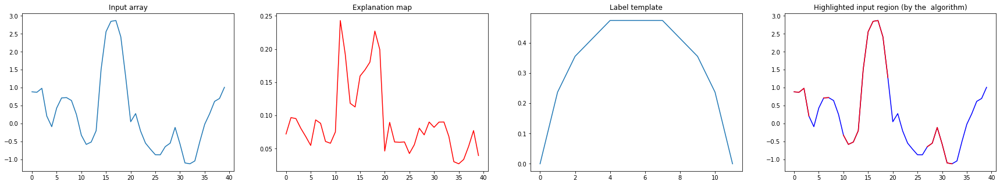

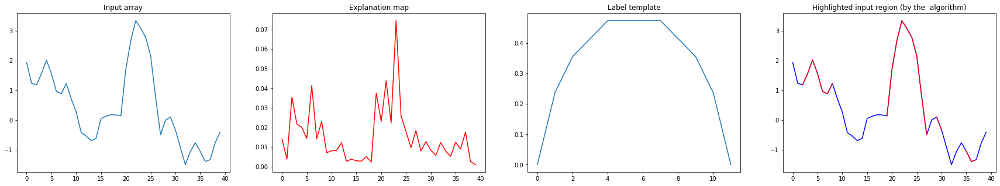

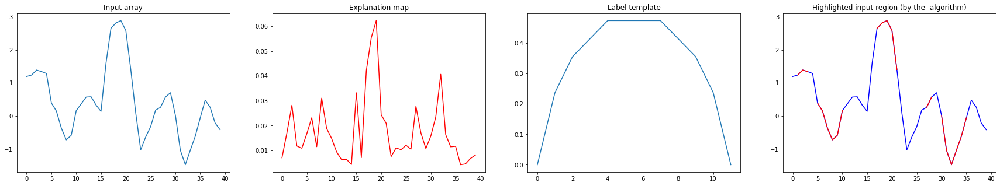

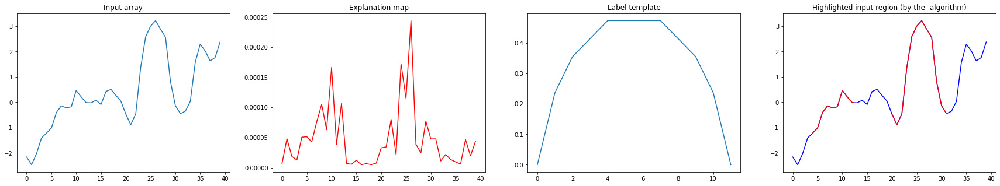

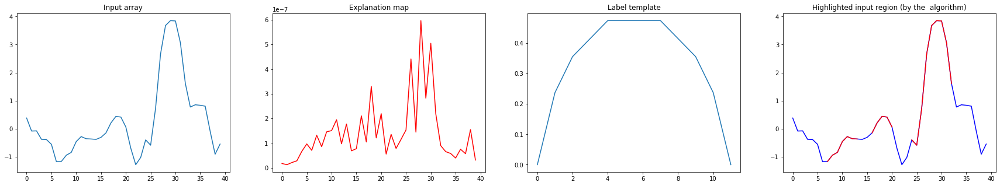

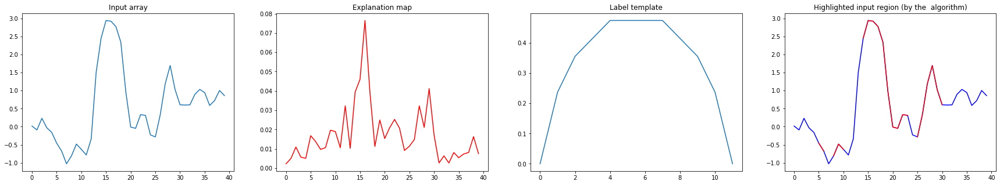

KeyboardInterrupt: ignored

In [54]:
## Show some examples of the success/failure.
prediction_5 = prediction[np.where(test_label==5)[0]]
print(prediction_5)
for idx in np.where(test_label==5)[0]:
  if prediction[idx] == 2:
      input = dataset['x_test'][idx]
      input = np.expand_dims(np.expand_dims(input, axis=0), axis=-1)
      # explanation_map = grad_cam(model, input, 'conv1d_2')[:,0]
      explanation_map = smooth_grad(model, input, 50, 0.02)[:,0]
      sorted_explanation_map = np.sort(explanation_map)
      threshold = np.sort(explanation_map)[-25]
      plt.figure(figsize=(30,5))
      plt.subplot(1,5,1)
      plt.plot(dataset['x_test'][idx])
      plt.title('Input array')

      plt.subplot(1,5,2)
      plt.plot(explanation_map, 'r')
      plt.title('Explanation map')

      plt.subplot(1,5,3)
      plt.plot(dataset['templates']['x'][0])
      plt.title('Label template')

      plt.subplot(1,5,4)
      plt.plot(dataset['templates']['x'][2])
      plt.title('Misclassified Label template')

      plt.subplot(1,5,5)
      plt.plot(input[0,:,0], 'b')
      input = input[0,:,0]*(explanation_map>threshold)
      input[input==0] = np.nan
      plt.plot(input, 'r')
      plt.title('Highlighted input region (by the  algorithm)')
      plt.show()

prediction_0 = prediction[np.where(test_label==0)[0]]
print(prediction_0)
for idx in np.where(test_label==0)[0]:
  if prediction[idx] == 0:
      input = dataset['x_test'][idx]
      input = np.expand_dims(np.expand_dims(input, axis=0), axis=-1)
      # explanation_map = grad_cam(model, input, 'conv1d_2')[:,0]
      explanation_map = smooth_grad(model, input, 50, 0.02)[:,0]
      sorted_explanation_map = np.sort(explanation_map)
      threshold = np.sort(explanation_map)[-25]
      plt.figure(figsize=(30,5))
      plt.subplot(1,4,1)
      plt.plot(dataset['x_test'][idx])
      plt.title('Input array')

      plt.subplot(1,4,2)
      plt.plot(explanation_map, 'r')
      plt.title('Explanation map')

      plt.subplot(1,4,3)
      plt.plot(dataset['templates']['x'][0])
      plt.title('Label template')

      plt.subplot(1,4,4)
      plt.plot(input[0,:,0], 'b')
      input = input[0,:,0]*(explanation_map>threshold)
      input[input==0] = np.nan
      plt.plot(input, 'r')
      plt.title('Highlighted input region (by the  algorithm)')
      plt.show()



# Explanation

In [11]:
from xai_utils import *

Take a test sample

In [12]:
x_test = dataset['x_test']
y_test = dataset['y_test']

Give the input to the model (Prediction)

In [13]:
index = int(np.floor(np.random.rand()*1000))
input = np.expand_dims(np.expand_dims(x_test[index], axis=0), axis=-1)
print(input.shape)
label = y_test[index]
print('Correct digit: '+str(label))
print('Predicted digit: '+str(np.argmax(model(np.expand_dims(np.expand_dims(x_test[index], axis=0), axis=-1)).numpy())))
print('Confidence score for the correct label: '+str(model(np.expand_dims(np.expand_dims(x_test[index], axis=0), axis=-1)).numpy()[0,label]))

(1, 40, 1)
Correct digit: 3
Predicted digit: 3
Confidence score for the correct label: 0.9999187


## SISE (Semantic Input Sampling for Explanation)

In [ ]:
explanation = SISE(input, model, label, [['conv1d_2']], grad_thr=0.)

Text(0.5, 1.0, 'Highlighted input region (by the SISE algorithm)')

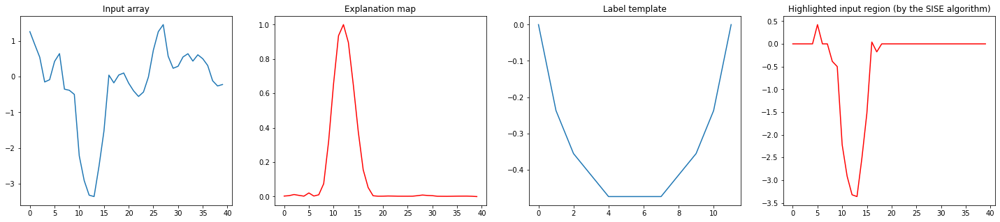

In [ ]:
threshold = np.sort(explanation[:,0])[-12]

plt.figure(figsize=(25,5))

plt.subplot(1,4,1)
plt.plot(input[0])
plt.title('Input array')

plt.subplot(1,4,2)
plt.plot(explanation, 'r')
plt.title('Explanation map')

plt.subplot(1,4,3)
plt.plot(dataset['templates']['x'][label])
plt.title('Label template')

plt.subplot(1,4,4)
plt.plot((input[0]*(explanation>threshold)), 'r')
plt.title('Highlighted input region (by the SISE algorithm)')

## Grad-CAM

In [56]:
def grad_cam(input_model, image, layer_name):
    cls = np.argmax(input_model.predict(image))
    def normalize(x):
        """Utility function to normalize a tensor by its L2 norm"""
        return (x + 1e-10) / (K.sqrt(K.mean(K.square(x))) + 1e-10)
    """GradCAM method for visualizing input saliency."""
    y_c = input_model.output
    conv_output = input_model.get_layer(layer_name).output
    feedforward1 = keras.models.Model([input_model.input], [conv_output, y_c])
    with tf.GradientTape() as tape:
        ff_results=feedforward1([image])
        all_fmap_masks, predictions = ff_results[0], ff_results[-1]
        loss = predictions[:, cls]
    grads_val = tape.gradient(loss, all_fmap_masks)
    if len(image.shape)==3:
        axis=(0, 1)
    elif len(image.shape)==4:
        axis=(0, 1, 2)
    weights = np.mean(grads_val, axis=axis)
    cam = np.dot(all_fmap_masks[0], weights)
    #print (cam)
    H,W= image.shape[1:3]
    cam = np.maximum(cam, 0)
    #cam = resize(cam, (H, W))
    cam = zoom(cam,H/cam.shape[0])
    #cam = np.maximum(cam, 0)
    cam = cam / cam.max()
    return np.expand_dims(cam, axis=-1)

def smooth_grad(input_model, image, n, noise_level):
  cls = np.argmax(input_model.predict(image))
  smooth_grads = np.zeros_like(image)
  std = np.sqrt(noise_level * (np.max(image) - np.min(image)))
  feedforward = keras.models.Model(input_model.input, input_model.output)
  i = 0
  while i < n:
    noise_input = image + np.random.normal(0, std, image.shape)
    noise_input = tf.Variable(noise_input, dtype=tf.float32)
    # noise_input = image
    with tf.GradientTape() as tape:
      preds = feedforward([noise_input])
      noise_label = np.argmax(preds)
      loss = preds[:, cls]
    if noise_label == cls:
      grads = tape.gradient(loss, noise_input)
      smooth_grads += np.abs(grads)
    i += 1
  smooth_grads /= i
  return smooth_grads[0,:,:]


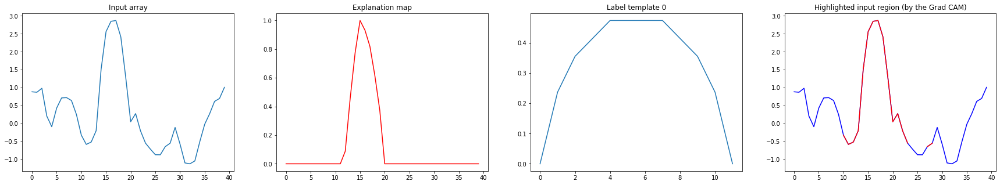

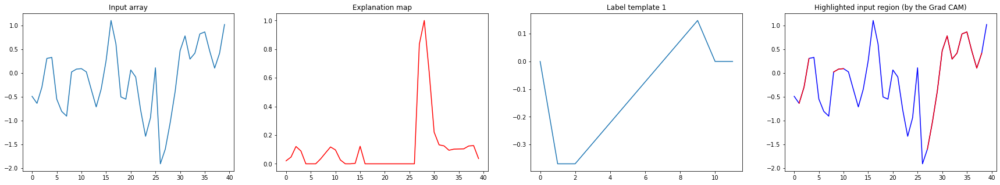

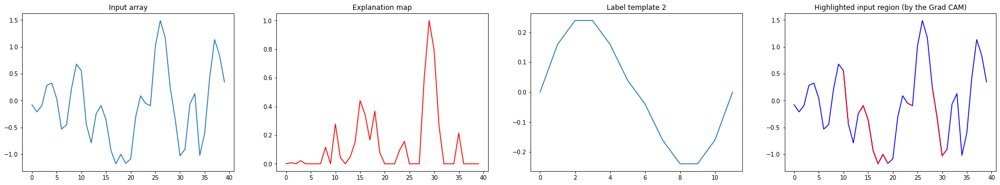

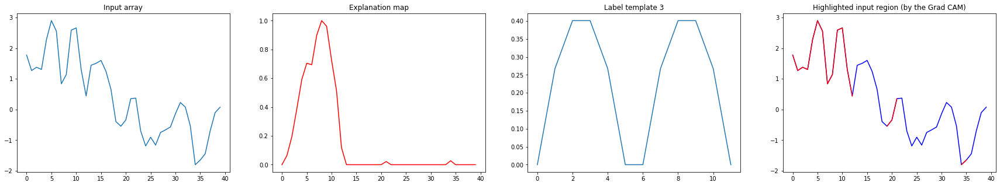

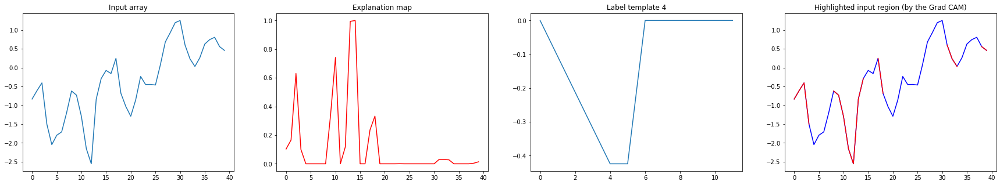

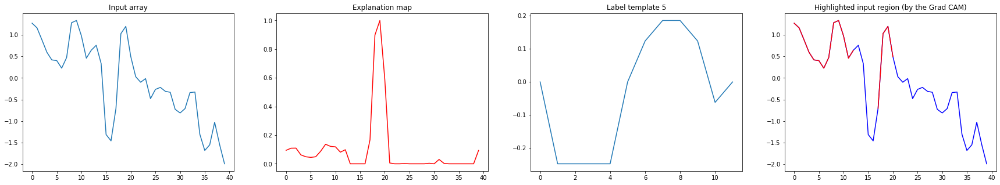

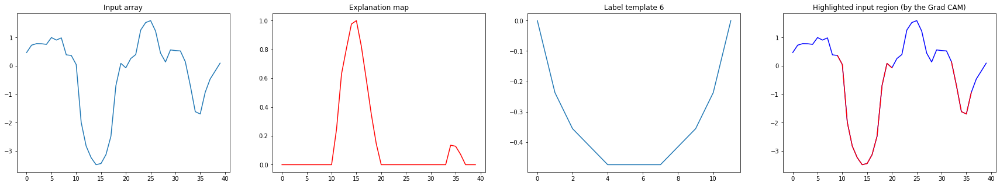

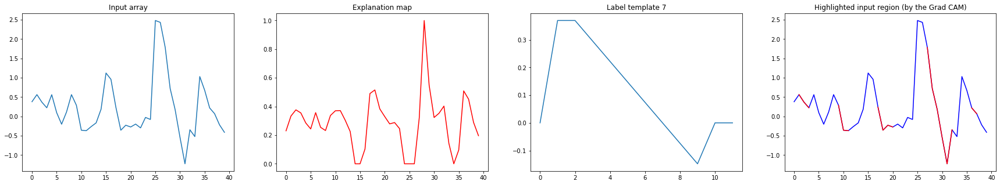

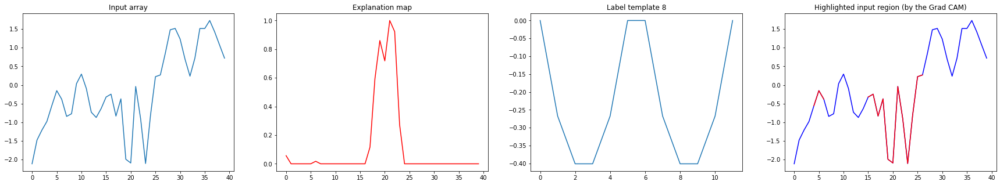

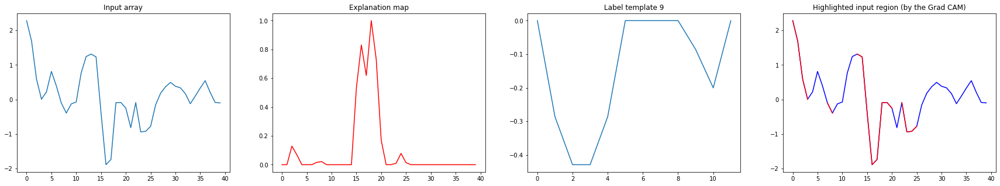

In [67]:
prob = model(dataset['x_test'])
prediction = np.argmax(prob, axis=1)
for i in range(10):
  cls = i
  cls_idx = np.where(dataset['y_test']==cls)[0]
  cls_pred = prediction[cls_idx]
  for j in range(len(cls_pred)):
    if cls_pred[j] == cls:
      break
  input_sample = dataset['x_test'][cls_idx[j]]
  input_sample = np.expand_dims(np.expand_dims(input_sample, axis=0), axis=-1)
  explanation = grad_cam(model, input_sample, 'conv1d_2')[:,0]
  # explanation = smooth_grad(model, input_sample, 50, 0.02)[:,0]
  threshold = np.sort(explanation)[-20]
  plt.figure(figsize=(30,5))
  plt.subplot(1,4,1)
  plt.plot(input_sample[0])
  plt.title('Input array')

  plt.subplot(1,4,2)
  plt.plot(explanation, 'r')
  plt.title('Explanation map')

  plt.subplot(1,4,3)
  plt.plot(dataset['templates']['x'][cls])
  plt.title('Label template {}'.format(cls))

  plt.subplot(1,4,4)
  plt.plot(input_sample[0,:,0], 'b')
  input_sample = input_sample[0,:,0]*(explanation>threshold)
  input_sample[input_sample==0] = np.nan
  plt.plot(input_sample, 'r')
  # pos = np.where(explanation>threshold)[0]
  # plt.plot(pos, input_sample[0,:,0][pos], 'b')
  plt.title('Highlighted input region (by the Grad CAM)')




2 1
5 2
7 3
9 4
7 5
9 6
2 7
4 8
1 9


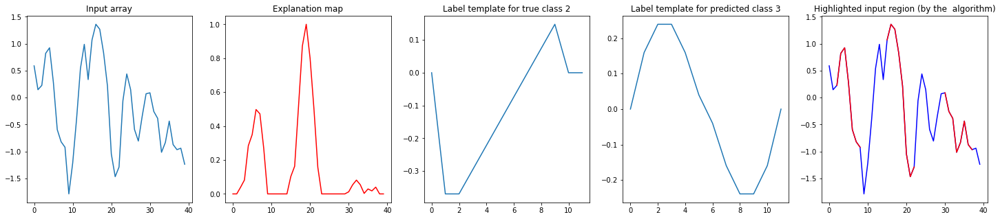

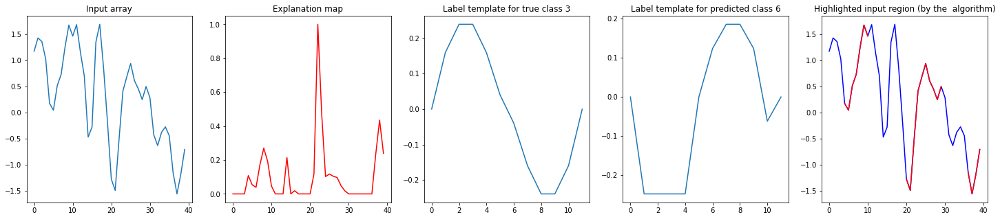

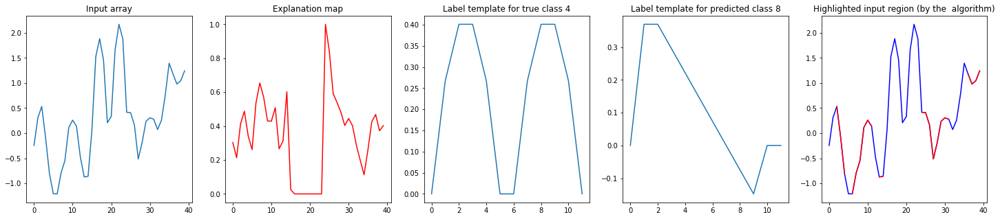

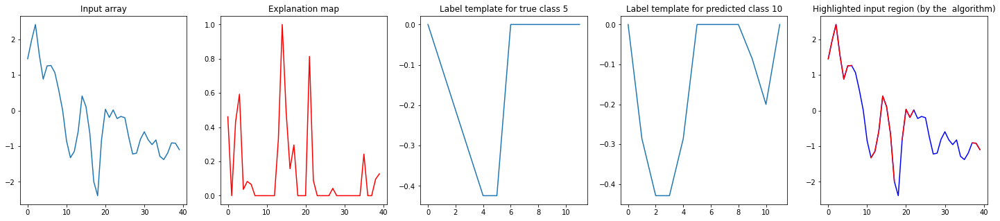

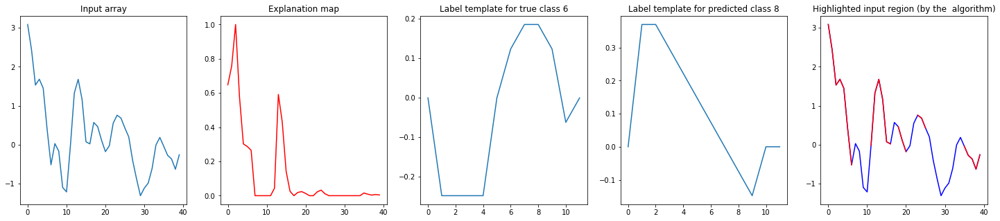

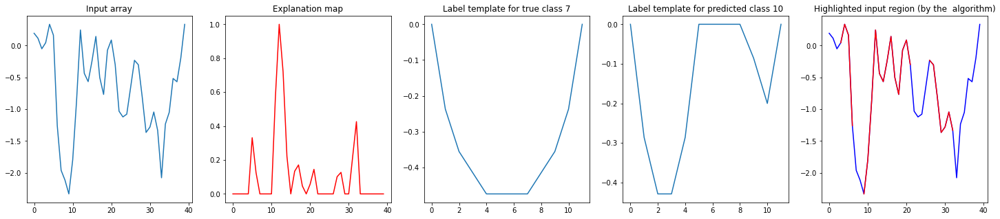

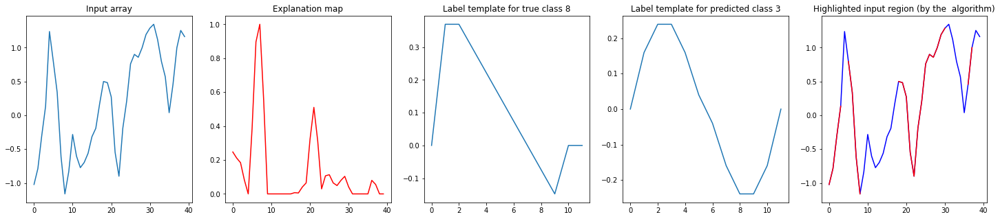

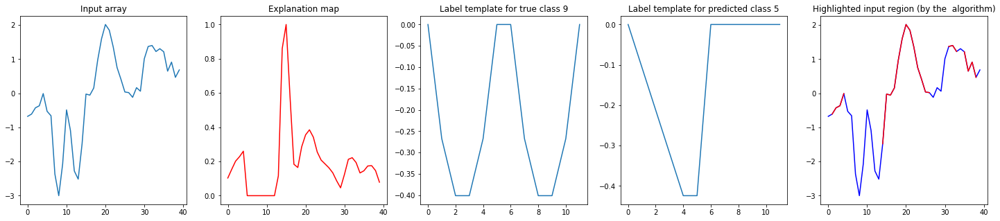

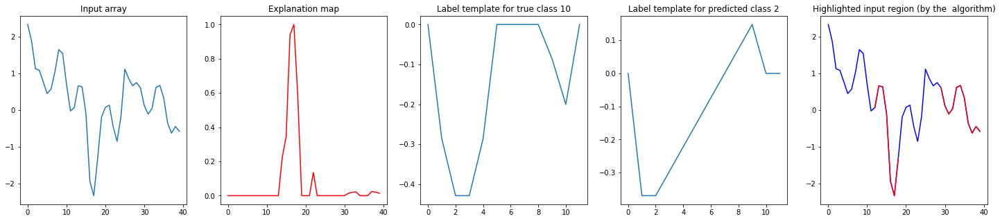

In [70]:
prob = model(dataset['x_test'])
prediction = np.argmax(prob, axis=1)
for i in range(10):
  cls = i
  cls_idx = np.where(dataset['y_test']==cls)[0]
  cls_pred = prediction[cls_idx]
  for j in range(len(cls_pred)):
    if cls_pred[j] != cls:
      print(cls_pred[j], cls)
      input_sample = dataset['x_test'][cls_idx[j]]
      input_sample = np.expand_dims(np.expand_dims(input_sample, axis=0), axis=-1)
      explanation = grad_cam(model, input_sample, 'conv1d_2')[:,0]
      # explanation = smooth_grad(model, input_sample, 50, 0.02)[:,0]
      threshold = np.sort(explanation)[-25]
      plt.figure(figsize=(25,5))
      plt.subplot(1,5,1)
      plt.plot(input_sample[0])
      plt.title('Input array')

      plt.subplot(1,5,2)
      plt.plot(explanation, 'r')
      plt.title('Explanation map')

      plt.subplot(1,5,3)
      plt.plot(dataset['templates']['x'][cls])
      t = 'Label template for true class {}'.format(cls+1)
      plt.title(t)

      plt.subplot(1,5,4)
      plt.plot(dataset['templates']['x'][cls_pred[j]])
      t = 'Label template for predicted class {}'.format(cls_pred[j]+1)
      plt.title(t)

      plt.subplot(1,5,5)
      plt.plot(input_sample[0,:,0], 'b')
      input_sample = input_sample[0,:,0]*(explanation>threshold)
      input_sample[input_sample==0] = np.nan
      plt.plot(input_sample, 'r')
      plt.title('Highlighted input region (by the  algorithm)')
      break


## Quantitative evaluation

In [71]:
def calculate_drop_increase(images, model, exmap, class_index, frac=0.15):
    '''
    inputs:
        images: a 4-D image of size (1 x H x W x 3)
          containing an image in RGB format and of size (H x W)
        model: The base model
        exmap: a given explanation map whose completeness is to be evaluated.
        class_index: The class to whom the explanation map is related to.
        frac: The fraction of top pixels selected.
    returns:v
        a tuple with 4 calculates values:
        (drop, increase, original_pred, eplanation_pred)
        drop (float): drop rate (between 0 and 1)
        increase (boolean): "1" if increase happened
        original_pred: confidence score for original image
        explanation_pred:  confidence score for the selected top pixels of the image.
    '''
    predictions = model.predict(images)
    #print(images.shape)
    # Pre-processing image 
    img=images[0,:,:]
    #img=img_to_array(img)
    img = np.expand_dims(img,axis=0)
    # Getting the prediction for image
    Y=predictions[0][class_index]
    
    grad_array=np.reshape(exmap, (-1,))
    array_size=int(grad_array.shape[0]*frac)
    thr=np.flip(sorted(grad_array))[array_size]
    exmap1_msk=(exmap>thr)
    exmap1_thr=np.zeros(shape=(1,40,1))
    exmap1_thr=img*exmap1_msk
    ex_predictions = model.predict(exmap1_thr)[0]
    O1=ex_predictions[class_index]
    etta=(Y-O1)/(Y+1e-100)
    return (etta*(etta>0), 1*(etta<0), Y, O1)

In [72]:
drop_rate = 0.
inc_rate = 0.
for index in range(1000):
    print(index)
    prediction=model(np.expand_dims(np.expand_dims(x_test[index], axis=0), axis=-1)).numpy()
    explanation_map = smooth_grad(model, np.expand_dims(np.expand_dims(x_test[index], axis=0), axis=-1), 50, 0.02)
    # explanation_map = grad_cam(model, np.expand_dims(np.expand_dims(x_test[index], axis=0), axis=-1), 'conv1d_2')
    res = calculate_drop_increase(np.expand_dims(np.expand_dims(x_test[index], axis=0), axis=-1), model, explanation_map, class_index=np.argmax(prediction[0]), frac=0.3)
    drop_rate += res[0]
    inc_rate += res[1]
drop_rate /= 1000
inc_rate /= 1000
print(drop_rate, inc_rate)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27